In [2]:
'''BASIC NUMERIC COMPUTATION'''
import numpy as np

'''DATA STORE DEFINITIONS'''
import pandas as pd

'''BASE MODULE FOR ANALYTICS'''
import sklearn

'''MODEL SELECTION'''
from sklearn.model_selection import train_test_split

'''PRE-PROCESSING'''
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder 

''' DIMENSIONALITY REDUCTION'''
from sklearn.decomposition import PCA

'''UNSUPERVISED ANOMALY DETECTION'''
from sklearn.ensemble import IsolationForest

'''VISUALIZATION MODULE'''
import matplotlib.pyplot as plt


'''PIPELINE MANAGEMENT/CREATION MODULE'''
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.compose import make_column_transformer

In [3]:
'''LOAD ALL DATASETS WITH CORRESPONDING NAMING CONVENTION'''

can_1502_morn =  pd.read_csv('IDF 20210215 072115.txt', sep="", header=0, delimiter='\t')

can_1502_eve = pd.read_csv('IDF 20210215 170017.txt', sep="", header=0, delimiter='\t')

can_1702_morn = pd.read_csv('IDF 20210217 072036.txt', sep="", header=0, delimiter='\t')

can_1702_eve = pd.read_csv('IDF 20210217 164043.txt', sep="", header=0, delimiter='\t')

can_2502_morn = pd.read_csv('IDF 20210225 070833.txt', sep="", header=0, delimiter='\t')

can_2502_eve = pd.read_csv('IDF 20210225 182529.txt', sep="", header=0, delimiter='\t')

can_2602_morn = pd.read_csv('IDF 20210226 070954.txt', sep="", header=0, delimiter='\t')

can_2602_eve = pd.read_csv('IDF 20210226 163130.txt', sep="", header=0, delimiter='\t')

can_0103_morn =  pd.read_csv('IDF 20210301 071339.txt', sep="", header=0, delimiter='\t')

can_0103_eve  = pd.read_csv('IDF 20210301 170719.txt', sep="", header=0, delimiter='\t')

datasets = [can_1502_morn ,can_1502_eve,can_1702_morn,can_1702_eve,can_2502_morn,can_2502_eve,can_2602_morn,can_2602_eve,can_0103_morn,can_0103_eve]

In [4]:
'''SOME BASIC PREPROCESSING/CLEANING STEPS'''
for elem in datasets:
    del elem[' ']

In [5]:
'''DEFINING NUMERIC AND CATEGORICAL COLUMNS'''
numeric_columns = ['SpeedFL','SpeedFR','SpeedRL','SpeedRR','SteeringPos']
categoric_columns = ['AmbientAirTemperature','Brake','LDI','RDI','HighBeamFlash','WiperMotor']
skip_columns = ['Timestamp','Latitude','Longitude']

In [6]:
'''PEEK AT SAMPLE DATA'''
can_1502_morn.head()

,Timestamp,SpeedFL,SpeedFR,SpeedRL,SpeedRR,AmbientAirTemperature,Brake,LDI,RDI,HighBeamFlash,WiperMotor,SteeringPos,Latitude,Longitude
0,441880,950,859,830,919,1,0,0,0,0,0,99,51.830862,5.826453
1,441930,890,830,830,740,1,0,0,0,0,0,99,51.830862,5.826453
2,441981,890,789,700,740,1,0,0,0,0,0,99,51.830862,5.826453
3,442031,789,770,700,700,1,0,0,0,0,0,99,51.830862,5.826453
4,442084,770,740,680,700,1,0,0,0,0,0,99,51.830861,5.826453


In [7]:
'''CHECK FOR MISSING VALUES'''
can_1502_morn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46233 entries, 0 to 46232
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Timestamp              46233 non-null  int64  
 1   SpeedFL                46233 non-null  int64  
 2   SpeedFR                46233 non-null  int64  
 3   SpeedRL                46233 non-null  int64  
 4   SpeedRR                46233 non-null  int64  
 5   AmbientAirTemperature  46233 non-null  int64  
 6   Brake                  46233 non-null  int64  
 7   LDI                    46233 non-null  int64  
 8   RDI                    46233 non-null  int64  
 9   HighBeamFlash          46233 non-null  int64  
 10  WiperMotor             46233 non-null  int64  
 11  SteeringPos            46233 non-null  int64  
 12  Latitude               46233 non-null  float64
 13  Longitude              46233 non-null  float64
dtypes: float64(2), int64(12)
memory usage: 4.9 MB


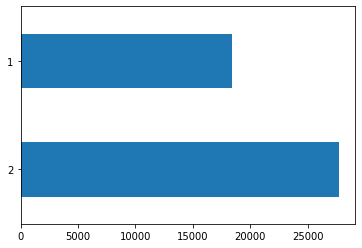

In [8]:
'''LOOKING AT THE DISTRIBUTION OF DATA IN CATEGORICAL COLUMNS'''

'''AMBIENT AIR TEMPERATURE'''
can_1502_morn['AmbientAirTemperature'].value_counts().plot(kind='barh')

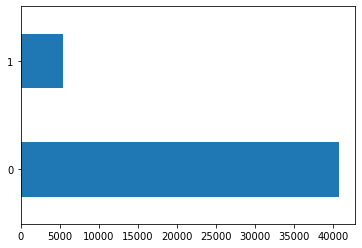

In [9]:
'''BRAKES'''
can_1502_morn['Brake'].value_counts().plot(kind='barh')

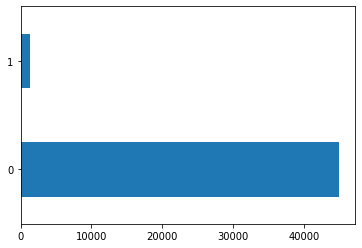

In [10]:
'''LEFT INDICATOR'''
can_1502_morn['LDI'].value_counts().plot(kind='barh')

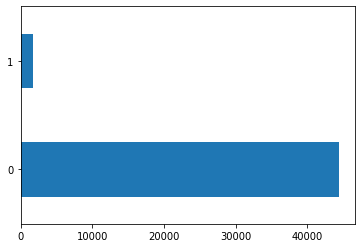

In [11]:
'''RIGHT INDICATOR'''
can_1502_morn['RDI'].value_counts().plot(kind='barh')

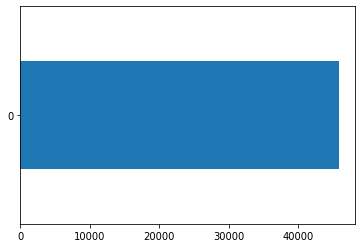

In [13]:
'''HIGH BEAM FLASH'''
can_1502_eve['HighBeamFlash'].value_counts().plot(kind='barh')

### HIGH BEAM FLASH HAS ONLY ONE CLASS: '0', INDICATING HIGH BEAM FLASH WAS NEVER USED DURING THIS PARTICULAR TRIP ###
### UPON FURTHER ANALYSIS, NONE OF THE DATASETS HAVE A POSITIVE VALUE FOR THIS COLUMN, IMPLYING IT CAN BE IGNORED SAFELY.
categoric_columns.remove('HighBeamFlash')
skip_columns.append('HighBeamFlash')

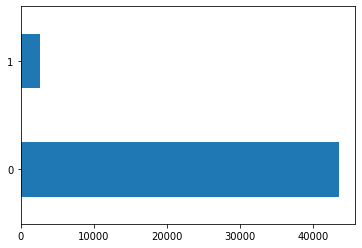

In [14]:
'''WIPER MOTOR'''
can_1502_morn['WiperMotor'].value_counts().plot(kind='barh')

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000025EC37FED68>,
      dtype=object)

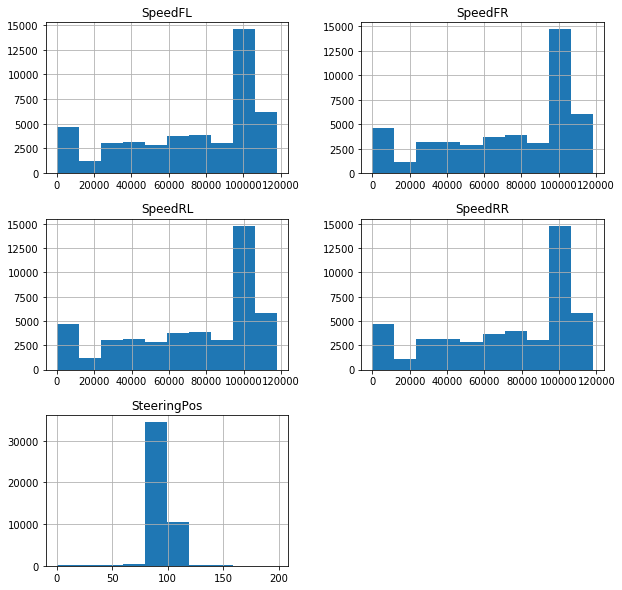

In [15]:
'''ANALYZING DATA DISTRIBUTION IN NUMERIC COLUMNS'''
can_1502_morn[numeric_columns].hist(figsize=(10,10))

In [17]:
# '''RETURNS A MODEL AFTER DOING PREPROCESSING AND DIMENSIONALITY REDUCTION FOR NUMERICAL FEATURES'''

# def create_model(X,model):

#     '''PREPROCESSING DATA: STANDARDIZATION'''
#     X_std = StandardScaler().fit_transform(X[numeric_columns])

#     '''DIMENSIONALITY REDUCTION'''
#     X_pca = PCA().fit_transform(X_std)

#     # '''TAKING THE FIRST TWO COMPONENTS FROM PCA'''
#     # x = pd.Series([elem[0] for elem in X_pca])
#     # y = pd.Series([elem[1] for elem in X_pca])

#     '''FIT MODEL TO TRAINING DATA'''
#     model.fit(X_pca)

#     return model


In [73]:
'''FUNCTION WHICH RETURNS A GRAPH PLOTTING THE CONTOURS OF THE DECISION FUNCTION ALONG WITH ORIGINAL DATA POINTS'''

def plot_decision_contours(X_train,X_test,model,random_state=43):

    '''X_train,X_test: Train Test Input Data
       model: Not Fitted Unsupervised Model
       random_state: Set Same Value for Reproducible Results'''
    
    '''SELECT ONLY NUMERIC COLUMNS FOT BOTH TRAIN AND TEST DATA'''
    X_train = X_train[numeric_columns]
    X_test  = X_test[numeric_columns]


    '''PREPROCESSING DATA: STANDARDIZATION'''
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)

    '''TRANSFORMING TEST DATA USING FITTED SCALER'''
    X_test = scaler.transform(X_test)

    '''DIMENSIONALITY REDUCTION'''
    pca = PCA(n_components=2)
    X_train = pca.fit_transform(X_train)

    '''TRANSFORMING TEST DATA USING FITTED PCA INSTANCE'''
    X_test = pca.transform(X_test)

    '''TAKING THE FIRST TWO COMPONENTS FROM PCA'''
    x_train_1 = pd.Series([elem[0] for elem in X_train])
    x_train_2 = pd.Series([elem[1] for elem in X_train])

    x_test_1 = pd.Series([elem[0] for elem in X_test])
    x_test_2 = pd.Series([elem[0] for elem in X_test])

    '''FITTING MODEL TO TRAIN DATA'''
    model.fit(X_train)

    '''USING FITTED MODEL TO PREDICT ON TEST DATA'''
    y_pred_test = model.predict(X_test)
    
    # plot the line, the samples, and the nearest vectors to the plane
    xx, yy = np.meshgrid(np.linspace(x_train_1.min(),x_train_1.max(),500 ), np.linspace(x_train_2.min(),x_train_2.max(), 500))
    Z = model.decision_function(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    plt.title("Isolation Forest Decision Function Contours: ")
    plt.contourf(xx, yy, Z, cmap=plt.cm.Blues_r)

    x_pred_outlier = list()
    x_pred_inlier = list()

    for index in range(len(X_test)):
        if y_pred_test[index] == -1:
            x_pred_outlier.append(X_test[index])
        if y_pred_test[index] == 1:
            x_pred_inlier.append(X_test[index])



    b2 = plt.scatter([elem[0] for elem in x_pred_inlier],[elem[1] for elem in x_pred_inlier], c='green',
                     s=20, edgecolor='k')
    c = plt.scatter([elem[0] for elem in x_pred_outlier],[elem[1] for elem in x_pred_outlier], c='red',
                    s=20, edgecolor='k')
    plt.axis('tight')
    plt.xlim((x_train_1.min(), x_train_1.max()))
    plt.ylim((x_train_2.min(), x_train_2.max()))
    plt.legend([b2,c],
            ["inliers","outliers"],
            loc="upper left")
    plt.show()

    
    return scaler,pca,model

In [20]:
'''CONSTRUCTING TRAINING DATA FROM ALL TRIPS BEFORE 1ST MARCH'''
X_train = can_1502_morn.append(can_1502_eve).append(can_1702_morn).append(can_1702_eve).append(can_2502_morn).append(can_2502_eve).append(can_2602_morn).append(can_2602_eve)

'''CONSTRUCTING TEST DATA FROM TRIPS ON 1ST MARCH'''
X_test = can_0103_morn.append(can_0103_eve)

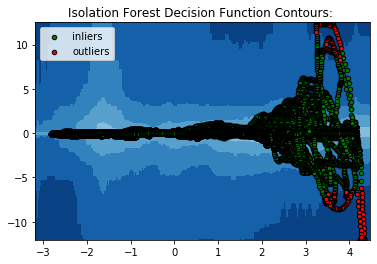

In [121]:
'''GENERATE SCALER, PCA DIMENSION REDUCER, AND BASE MODEL'''
'''CONTAMINATION: AMOUNT OF OUTLIERS; 
                  BETWEEN 0 AND 0.5;
                  LOWER CONTAMINATION RESULTS IN FEWER NUMBER OF OUTLIERS;
                  CURRENT SPEC ASSUMES 0.5% CONTAMINATION'''
scl,pca,model = plot_decision_contours(X_train,X_test,model=IsolationForest(contamination=0.005))

In [122]:
'''GENERATE PREDICTIONS USING CREATED MODEL'''
pred = model.predict(pca.transform(scl.transform(X_test[numeric_columns])))

In [123]:
'''TOTAL NUMBER OF OUTLIERS IN THE TEST SET(01 MAR) IDENTIFIED BY THE MODEL'''
len([elem for elem in pred if elem == -1])

254

In [124]:
'''INDICES OF ALL OUTLIERS'''
outlier_indices = list()
for index in range(len(pred)):
    if pred[index] == -1:
       outlier_indices.append(index)

In [125]:
'''LIST OF GPS COORDINATES OF ALL OUTLIERS'''
gps = [list(X_test.iloc[index][['Latitude','Longitude']]) for index in outlier_indices]

In [126]:
'''STORE OUTLIER GPS COORDINATES'''
pd.DataFrame(gps,columns=['Latitude','Longitude']).to_csv('outlier_gps.csv')